In [5]:
import pandas as pd
import numpy as np
from scipy.stats import gaussian_kde

In [21]:
# Plotting functions
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go

def plot_2d_fts(
        df : pd.DataFrame, 
        x: np.array, 
        title_="Functional time series", 
        alpha_=0.1):
    """
    df (pd.Dataframe): Dataframe with only function values where columns are functional objects and rows are grid points.
    x  (np.array): numpy array of x axis values

    ex: plot_2d_fts(df_densities, x=df_densities.index.values, title_ = "Densities over time")
    """
    cols = df.columns

    plt.figure(figsize=(15,5))
    for col in cols:
        plt.plot(x, df.loc[:, col], c="gray", alpha=alpha_)
    pointwise_mean = df.mean(axis=1)
    plt.plot(x, pointwise_mean, c="red", label="Point-wise mean")

    plt.title(title_)
    plt.legend()

    plt.show()

def plot_3d_fts(
        df: pd.DataFrame, 
        f_domain: np.array, 
        time_index: np.array, 
        title_="Functional Time Series", 
        axis_titles=["x","y","z"]):
    """
    ex: plot_3d_fts(df_lqds.iloc[1:-1,:], t[1:-1], df_lqds.columns, title_="LQDensities", axis_titles=["u", "Day", "LQDensity"])
    """
    domain = f_domain
    T = time_index
    image = [df.iloc[:,col] for col in range(df.shape[1])]

    fig = go.Figure(data=[go.Surface(
        x=domain, 
        y=T,
        z=image,  
        colorscale='Turbo'
    )])

    fig.update_layout(
        # title='Daily Kernel Density Estimates of Log Returns',
        scene=dict(
            xaxis_title=axis_titles[0],
            yaxis_title=axis_titles[1],
            zaxis_title=axis_titles[2],
        ),
        height=700,
        scene_camera=dict(
            eye=dict(x=0.7, y=2.0, z=0.8)  # change these values to rotate
        ),
        title={
            'text': title_,
            'x': 0.5,  # Center horizontally
            'xanchor': 'center'
        }
    )

    fig.show()

In [22]:
df_returns = pd.read_excel("../data/processed/BVSP_returns_wide.xlsx").drop(columns={"time"})
df_returns.head()

,2025-05-09,2025-05-12,2025-05-13,2025-05-14,2025-05-15,2025-05-16,2025-05-19,2025-05-20,2025-05-21,2025-05-22,...,2025-11-03,2025-11-04,2025-11-05,2025-11-06,2025-11-07,2025-11-10,2025-11-11,2025-11-12,2025-11-13,2025-11-14
0,0.000013,0.000401,0.001025,-0.000209,0.000191,-0.000640,-0.000567,-0.000059,-0.001468,0.000029,...,0.001345,-0.002193,0.000625,0.000521,-0.001515,0.001599,0.000816,0.000196,0.002274,-0.000096
1,0.001650,0.005783,0.001332,-0.001808,0.000190,-0.001614,-0.000080,-0.000137,-0.001692,0.002553,...,-0.000321,-0.000972,-0.001265,0.003632,-0.000195,0.005056,0.006151,0.000495,-0.002867,-0.001522
2,0.000186,-0.000437,0.000390,0.002208,0.000190,-0.001185,-0.000437,-0.001313,-0.000154,-0.001663,...,0.002498,0.000560,0.001152,0.000606,-0.001242,-0.000751,0.001339,0.000735,0.001060,0.000360
3,0.000668,-0.001724,0.001835,-0.000394,0.000190,-0.006405,0.000428,-0.000951,0.001047,0.000068,...,-0.000294,0.000643,-0.001085,-0.000445,0.001988,-0.000856,0.000798,-0.001151,0.001413,0.001121
4,0.000016,-0.001247,0.002284,0.001109,0.000190,-0.000040,0.000025,0.000930,-0.000055,-0.000076,...,-0.001736,0.000064,0.001857,0.000817,-0.000308,0.001132,0.001468,0.000986,0.002795,0.000449


In [50]:
def obtain_densities(df: pd.DataFrame, M: int, common_density_support=False):
    """
    M: number of grid points
    """
    cols = df.columns

    if common_density_support:
        # 1) Global support
        global_min = df.min().min()
        global_max = df.max().max()
        u = np.linspace(global_min, global_max, M)

        # 2) Prepare density matrix (m × T)
        df_densities = pd.DataFrame(index=u, columns=cols)

        # 3) KDE for each day evaluated on a common support
        for t in cols:
            kde = gaussian_kde(df[t])
            df_densities[t] = kde(u)

    if not common_density_support:
        supports  = []
        densities = []
        for col in cols:
            data = df.loc[:, col]
            kde = gaussian_kde(data)
            left_endpoint = data.min()
            right_endpoint = data.max()
            x_grid = np.linspace(left_endpoint, right_endpoint, M)
            supports.append(pd.Series(x_grid))
            y_kde = kde(x_grid)
            densities.append(pd.Series(y_kde))
        df_supports = pd.concat(supports, axis=1)
        df_supports.columns = cols
        df_densities = pd.concat(densities, axis=1)
        df_densities.columns = cols

    return df_supports, df_densities

In [51]:
df_supports, df_densities = obtain_densities(df_returns, M=3000)

In [52]:
df_supports.head()

,2025-05-09,2025-05-12,2025-05-13,2025-05-14,2025-05-15,2025-05-16,2025-05-19,2025-05-20,2025-05-21,2025-05-22,...,2025-11-03,2025-11-04,2025-11-05,2025-11-06,2025-11-07,2025-11-10,2025-11-11,2025-11-12,2025-11-13,2025-11-14
0,-0.001655,-0.001724,-0.001569,-0.001808,-0.002214,-0.006405,-0.001857,-0.001731,-0.002080,-0.003580,...,-0.001976,-0.002193,-0.001265,-0.001149,-0.001515,-0.001347,-0.002087,-0.002185,-0.002867,-0.001934
1,-0.001654,-0.001722,-0.001567,-0.001807,-0.002212,-0.006402,-0.001856,-0.001730,-0.002079,-0.003577,...,-0.001974,-0.002191,-0.001263,-0.001148,-0.001513,-0.001344,-0.002084,-0.002184,-0.002866,-0.001933
2,-0.001653,-0.001719,-0.001566,-0.001805,-0.002211,-0.006399,-0.001854,-0.001728,-0.002078,-0.003575,...,-0.001973,-0.002190,-0.001262,-0.001146,-0.001512,-0.001342,-0.002081,-0.002182,-0.002864,-0.001932
3,-0.001652,-0.001717,-0.001565,-0.001804,-0.002210,-0.006396,-0.001853,-0.001727,-0.002077,-0.003572,...,-0.001971,-0.002189,-0.001261,-0.001145,-0.001511,-0.001340,-0.002079,-0.002181,-0.002862,-0.001930
4,-0.001651,-0.001714,-0.001564,-0.001803,-0.002209,-0.006392,-0.001852,-0.001726,-0.002075,-0.003570,...,-0.001970,-0.002188,-0.001260,-0.001143,-0.001510,-0.001338,-0.002076,-0.002179,-0.002860,-0.001929


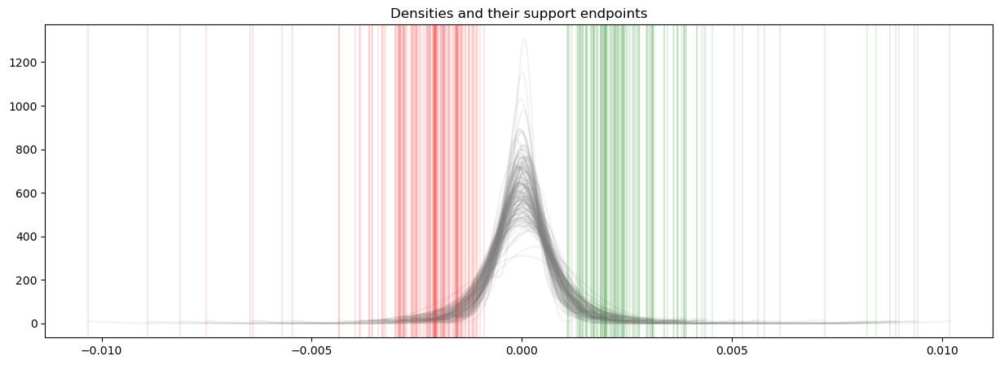

In [53]:
plt.figure(figsize=(15,5))

for col in df_densities.columns:
    plt.plot(df_supports.loc[:,col], df_densities.loc[:,col], c="gray", alpha=.1)
    plt.axvline(x=df_supports.loc[:,col].iloc[0], color='red', linestyle='-', alpha=0.1)
    plt.axvline(x=df_supports.loc[:,col].iloc[-1], color='green', linestyle='-', alpha=0.1)

plt.title("Densities and their support endpoints")
plt.show()

In [45]:
# Transformation functions
from scipy.integrate import cumulative_trapezoid, quad, trapezoid
from scipy.interpolate import interp1d, CubicSpline
def dens2lqd(dens, dSup, lqdSup=None, t0=None, verbose=True):
    dens = np.asarray(dens)
    dSup = np.asarray(dSup)

    # Default t0
    if t0 is None:
        t0 = dSup[0]

    # ---- Check density requirements ----
    if np.any(dens < 0):
        raise ValueError("Please correct negative density values.")

    if abs(trapezoid(dens, dSup) - 1) > 1e-5:
        if verbose:
            print("Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.")
        dens = dens / trapezoid(dens, dSup)

    # ---- Handle zero density values by truncating support ----
    if np.any(dens == 0):
        if verbose:
            print("There are some zero density values - truncating support grid so all are positive")

        positive_idx = np.where(dens > 0)[0]
        lbd, ubd = positive_idx[0], positive_idx[-1]

        dens = dens[lbd:ubd+1]
        dSup = dSup[lbd:ubd+1]

        dens = dens / trapezoid(dens, dSup)

    N = len(dSup)

    # ---- Check LQD output grid ----
    if lqdSup is None:
        lqdSup = np.linspace(0, 1, N)
    else:
        lqdSup = np.asarray(lqdSup)
        if not (np.isclose(lqdSup.min(), 0) and np.isclose(lqdSup.max(), 1)):
            if verbose:
                print("Problem with support of the LQD domain’s boundaries - resetting to default.")
            lqdSup = np.linspace(0, 1, N)

    # ---- Check t0 ----
    if t0 not in dSup:
        if verbose:
            print("t0 is not a value in dSup - resetting to closest value")
        t0 = dSup[np.argmin(np.abs(dSup - t0))]

    M = len(lqdSup)
    c_ind = np.where(dSup == t0)[0][0]

    # ---- Compute CDF and constant c ----
    tmp = cumulative_trapezoid(dens, dSup, initial=0)
    c = tmp[c_ind]

    # ---- Remove duplicated CDF values (monotonicity issues in KDE) ----
    left_dup  = np.concatenate([np.diff(tmp[:N//2]) == 0, [False]])
    right_dup = np.concatenate([[False], np.diff(tmp[N//2:]) == 0])

    # NOTE: In R: !c(indL, indR)
    keep = ~(np.concatenate([left_dup, right_dup]))

    qtemp = tmp[keep]
    lqd_temp = -np.log(dens[keep])

    # ---- Interpolate lqd on the desired LQD support ----
    lqd = np.zeros(M)

    # Handle infinite boundary values
    temp_first_inf = np.isinf(lqd_temp[0])
    temp_last_inf = np.isinf(lqd_temp[-1])

    if temp_first_inf or temp_last_inf:

        tmpInd = np.arange(len(qtemp))
        Ind = np.arange(M)

        if temp_first_inf:
            lqd[0] = np.inf
            tmpInd = tmpInd[1:]
            Ind = Ind[1:]

        if temp_last_inf:
            lqd[-1] = np.inf
            tmpInd = tmpInd[:-1]
            Ind = Ind[:-1]

        interp = interp1d(qtemp[tmpInd], lqd_temp[tmpInd],
                          kind="linear", fill_value="extrapolate")
        lqd[Ind] = interp(lqdSup[Ind])

    else:
        interp = interp1d(qtemp, lqd_temp, kind="linear",
                          fill_value="extrapolate")
        lqd = interp(lqdSup)

    return lqdSup, lqd, c

In [93]:
def obtain_lqds(
        df_supports  : pd.DataFrame,
        df_densities : pd.DataFrame, 
        lqd_sup_M=None):
    if lqd_sup_M:
        M = lqd_sup_M
    else:
        M = df_densities.shape[0]
    lqdSup_ = np.linspace(0,1, M)

    # lqds_sup = []
    lqds = []
    cs = []
    cols = df_densities.columns
    for col in cols:
        density_support = df_supports.loc[:,col]
        density = df_densities.loc[:,col]
        t0_ = density_support.iloc[np.argmin(np.abs(density_support))] #closes value to 0
        lqdsup, lqd, c = dens2lqd(
                                dens = density, 
                                dSup = density_support, 
                                lqdSup=lqdSup_, 
                                t0 = t0_)
        # lqds_sup.append(lqdSup) # no need since the image of the LQDT is shared by all densities by construction
        lqds.append(pd.Series(lqd))
        cs.append(c)
    
    df_lqds = pd.concat(lqds, axis=1)
    df_lqds.columns = cols
    
    return lqdSup_, df_lqds, cs

In [94]:
lqdSup, df_lqds, c = obtain_lqds(df_supports, df_densities) 

Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5 - renormalizing now.
Density does not integrate to 1 with tolerance 1e-5

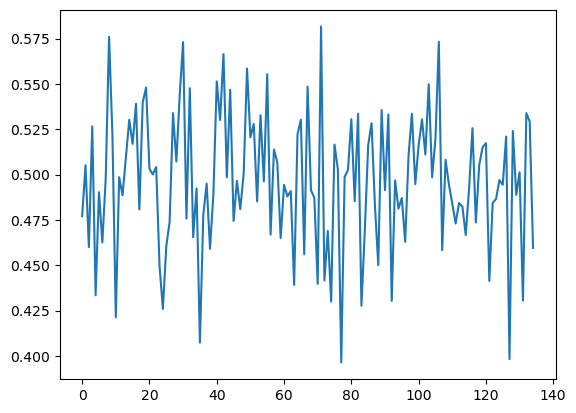

In [96]:
plt.figure()

plt.plot(c)

plt.show()

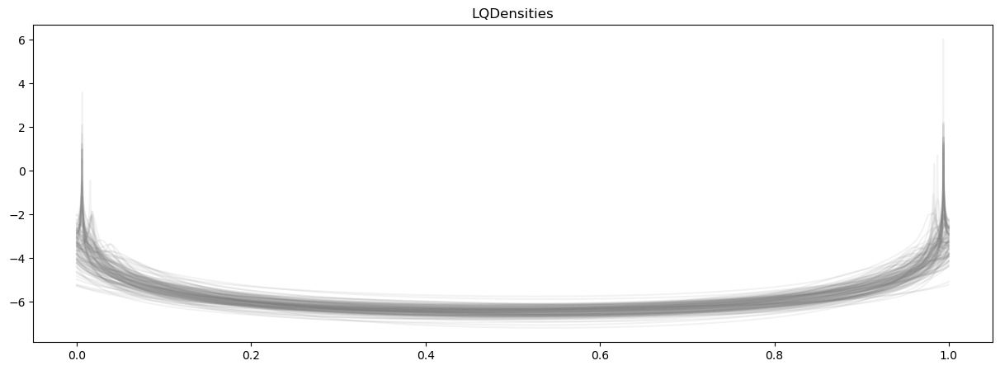

In [97]:
plt.figure(figsize=(15,5))

for col in df_densities.columns:
    plt.plot(lqdSup, df_lqds.loc[:,col], c="gray", alpha=.1)

plt.title("LQDensities")
plt.show()

In [98]:
plot_3d_fts(df_lqds, lqdSup, df_lqds.columns)